In [1]:
using Distributions
using Random
using StatsBase
using StatsPlots

function plot_sim(dist, n; μ=mean(dist), L=10^6, D=TDist(n-1))
    testname = D == TDist(n-1) ? "t-test, " : D == Normal() ? "no correction, " : ""
    distname = replace(string(dist), r"{[^}]*}"=>"")
    pval = Vector{Float64}(undef, L)
    Xtmp = [Vector{Float64}(undef, n) for _ in 1:Threads.nthreads()]
    Threads.@threads for i in 1:L
        tid = Threads.threadid()
        X = Xtmp[tid]
        rand!(dist, X)
        X̄ = mean(X)
        S = std(X)
        T = √n * (X̄ - μ) / S
        pval[i] = 2ccdf(D, abs(T))
    end
    _ecdf_pval = ecdf(pval)
    ecdf_pval(x) = _ecdf_pval(x)
    println("n = $n => coverage probability (α=5%) = ", 1 - ecdf_pval(0.05))
    plot(ecdf_pval, 0, 0.1; label="")
    plot!(identity; label="", c=:grey, ls=:dash)
    plot!(xtick=0:0.01:1, ytick=0:0.01:1, xrotation=30)
    plot!(xguide="nominl significance level α", yguide="probability of P-value ≤ α")
    title!("$testname$distname, n=$n", titlefontsize=9)
    plot!(size=(400, 420), tickfontsize=6, guidefontsize=8)
end

function plot_sims(dist; ns=(5, 10, 20, 100), correction=true)
    distname = replace(string(dist), r"{[^}]*}"=>"")
    println("skewness of $distname = ", skewness(dist))
    println("kurtosis of $distname = ", kurtosis(dist))
    println()
    PP = []
    for n in ns
        D = correction ? TDist(n-1) : Normal()
        P = plot_sim(dist, n; D)
        push!(PP, P)
    end
    println()
    plot(PP...; size=(800, 840))
end

plot_sims (generic function with 1 method)

skewness of Normal(μ=0.0, σ=1.0) = 0.0
kurtosis of Normal(μ=0.0, σ=1.0) = 0.0

n = 5 => coverage probability (α=5%) = 0.8782449999999999
n = 10 => coverage probability (α=5%) = 0.918214
n = 20 => coverage probability (α=5%) = 0.935106
n = 100 => coverage probability (α=5%) = 0.947357



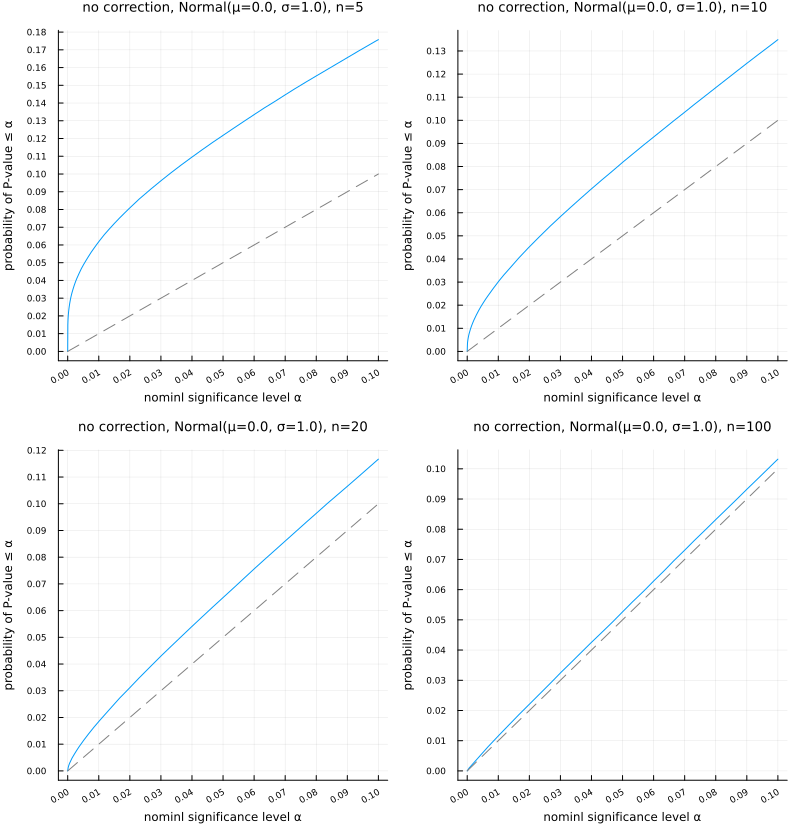

In [2]:
plot_sims(Normal(); ns=(5, 10, 20, 100), correction=false)

skewness of Normal(μ=0.0, σ=1.0) = 0.0
kurtosis of Normal(μ=0.0, σ=1.0) = 0.0

n = 5 => coverage probability (α=5%) = 0.949987
n = 10 => coverage probability (α=5%) = 0.950006
n = 20 => coverage probability (α=5%) = 0.950019
n = 100 => coverage probability (α=5%) = 0.949953



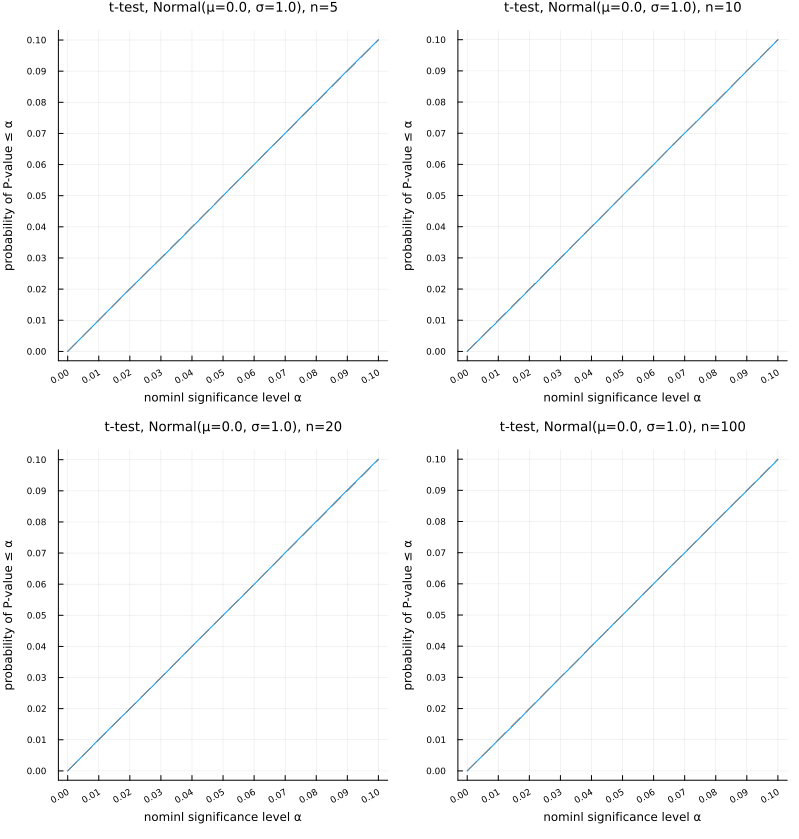

In [3]:
plot_sims(Normal(); ns=(5, 10, 20, 100))

skewness of Uniform(a=0.0, b=1.0) = 0.0
kurtosis of Uniform(a=0.0, b=1.0) = -1.2

n = 5 => coverage probability (α=5%) = 0.869792
n = 10 => coverage probability (α=5%) = 0.915589
n = 20 => coverage probability (α=5%) = 0.934064
n = 100 => coverage probability (α=5%) = 0.947362



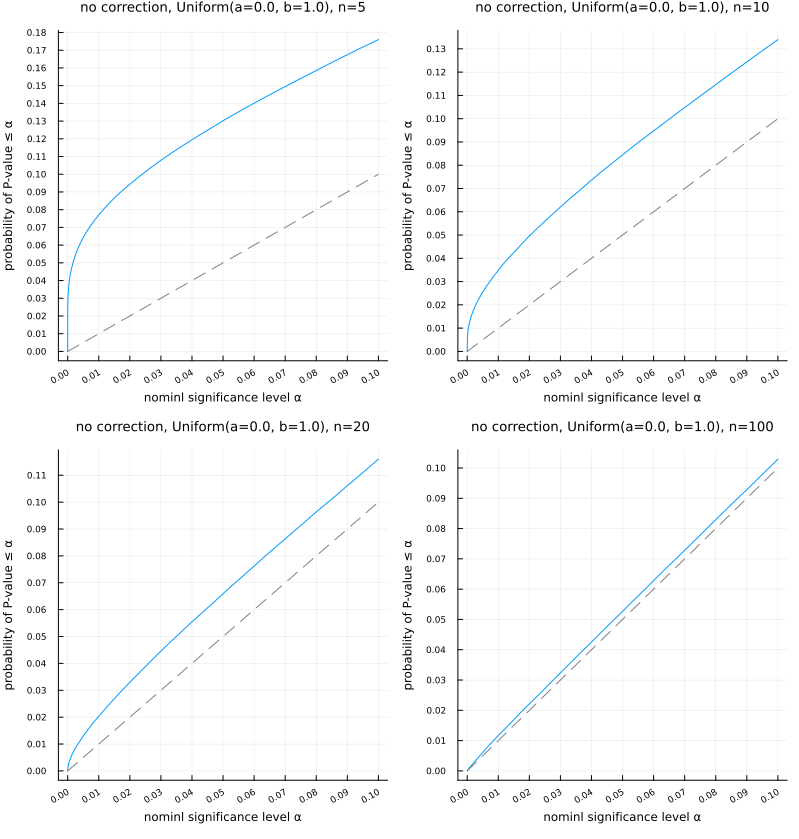

In [4]:
plot_sims(Uniform(); ns=(5, 10, 20, 100), correction=false)

skewness of Uniform(a=0.0, b=1.0) = 0.0
kurtosis of Uniform(a=0.0, b=1.0) = -1.2

n = 5 => coverage probability (α=5%) = 0.934477
n = 10 => coverage probability (α=5%) = 0.945646
n = 20 => coverage probability (α=5%) = 0.948423
n = 100 => coverage probability (α=5%) = 0.9499070000000001



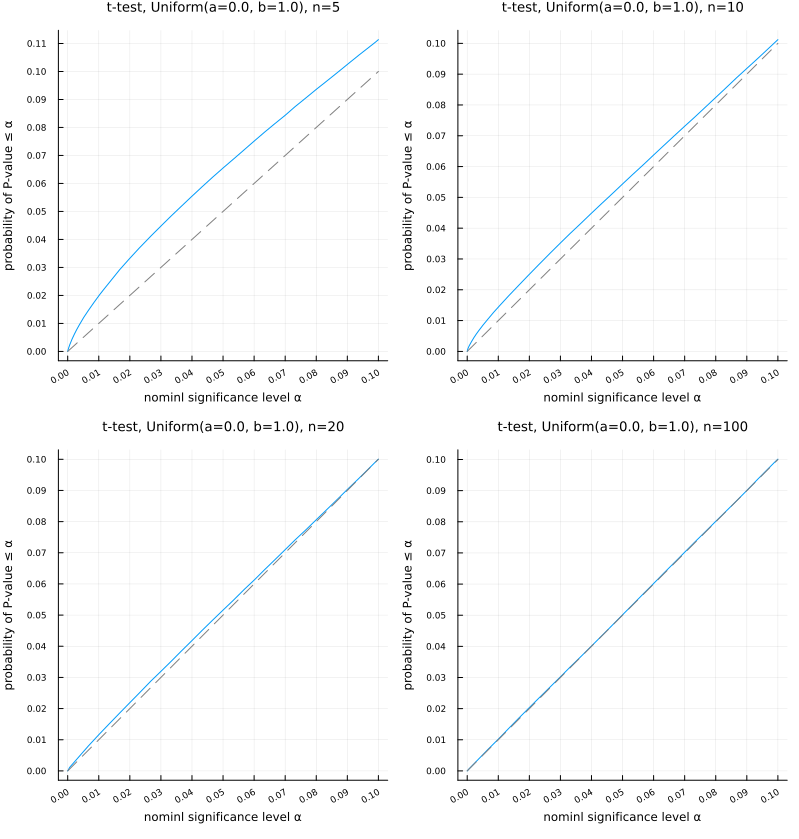

In [5]:
plot_sims(Uniform(); ns=(5, 10, 20, 100))

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 5 => coverage probability (α=5%) = 0.81185
n = 10 => coverage probability (α=5%) = 0.869308
n = 20 => coverage probability (α=5%) = 0.904388
n = 100 => coverage probability (α=5%) = 0.939111



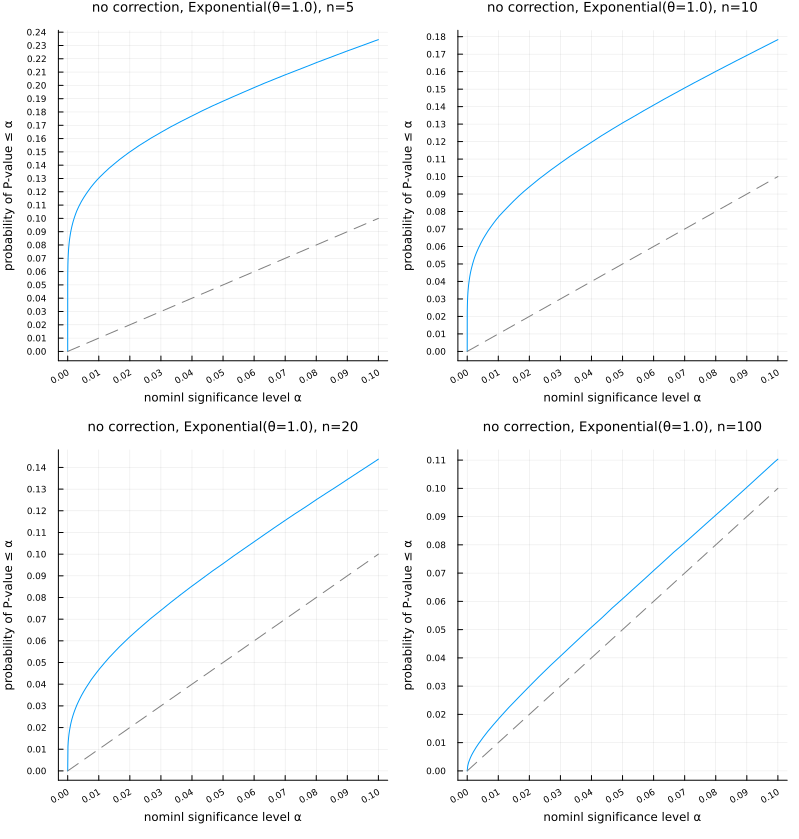

In [6]:
plot_sims(Exponential(); ns=(5, 10, 20, 100), correction=false)

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 5 => coverage probability (α=5%) = 0.8830830000000001
n = 10 => coverage probability (α=5%) = 0.90043
n = 20 => coverage probability (α=5%) = 0.918579
n = 100 => coverage probability (α=5%) = 0.941933



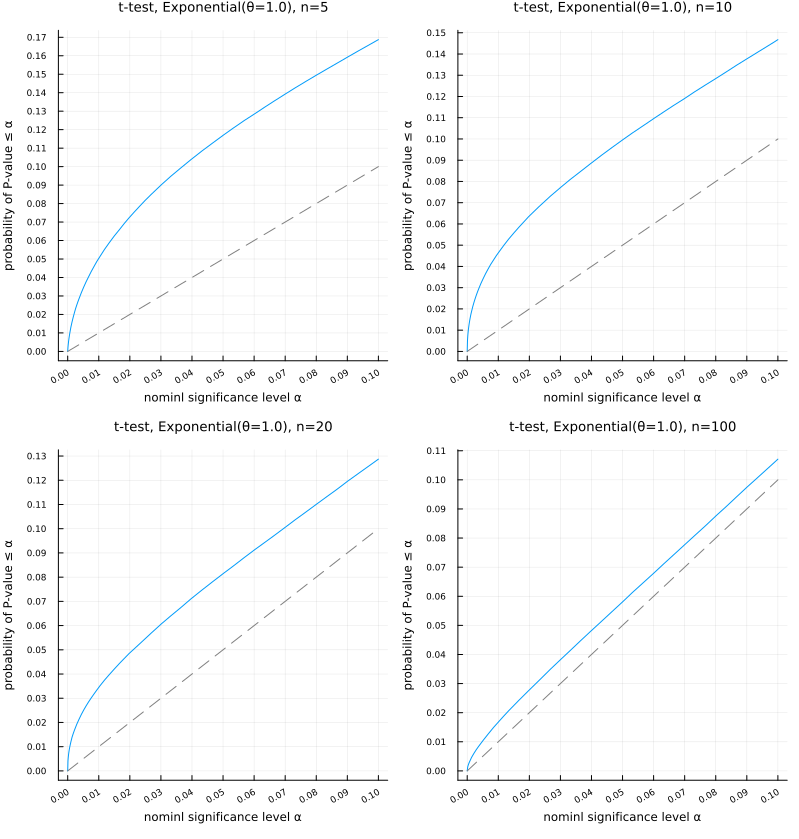

In [7]:
plot_sims(Exponential(); ns=(5, 10, 20, 100))

skewness of Exponential(θ=1.0) = 2.0
kurtosis of Exponential(θ=1.0) = 6.0

n = 100 => coverage probability (α=5%) = 0.941454
n = 200 => coverage probability (α=5%) = 0.945769
n = 500 => coverage probability (α=5%) = 0.948343
n = 1000 => coverage probability (α=5%) = 0.949301



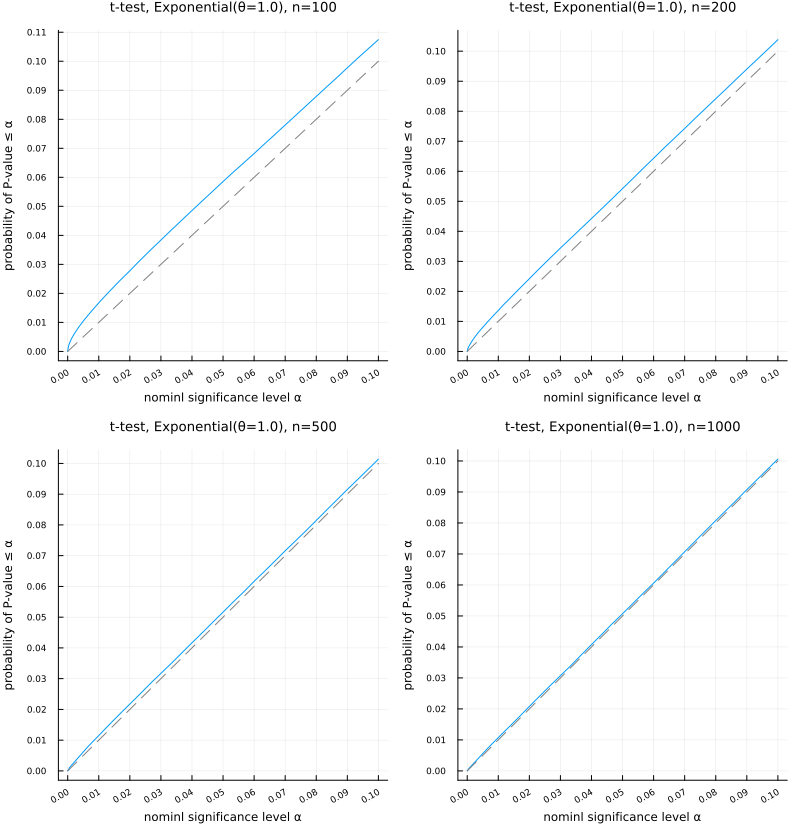

In [8]:
plot_sims(Exponential(); ns=(100, 200, 500, 1000))

skewness of Beta(α=0.1, β=0.1) = 0.0
kurtosis of Beta(α=0.1, β=0.1) = -1.875

n = 5 => coverage probability (α=5%) = 0.9020900000000001
n = 10 => coverage probability (α=5%) = 0.910635
n = 20 => coverage probability (α=5%) = 0.934668
n = 100 => coverage probability (α=5%) = 0.946468



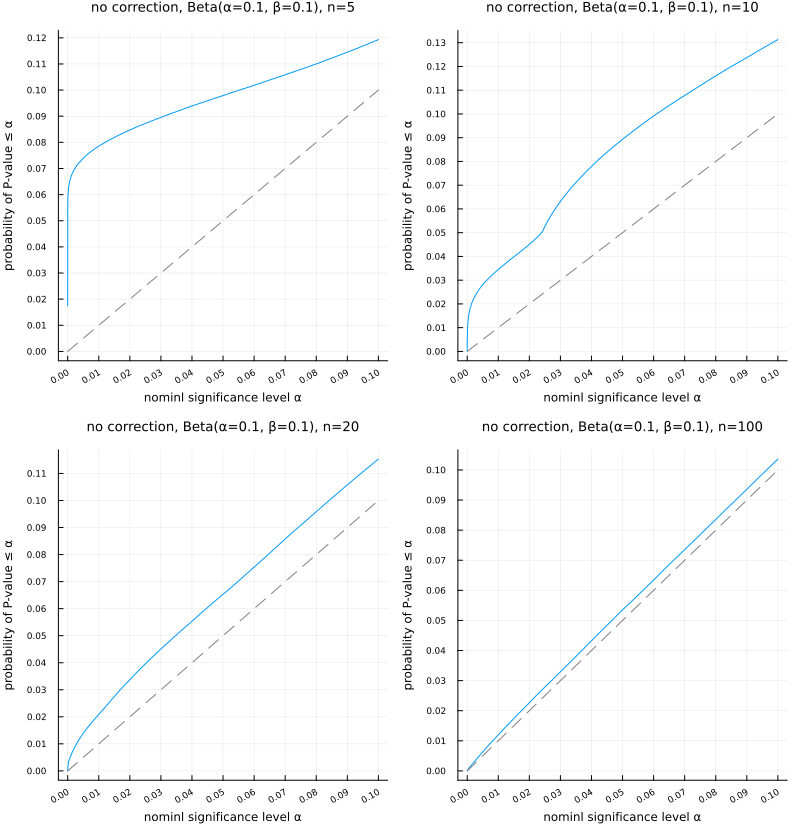

In [9]:
plot_sims(Beta(0.1, 0.1); ns=(5, 10, 20, 100), correction=false)

skewness of Beta(α=0.1, β=0.1) = 0.0
kurtosis of Beta(α=0.1, β=0.1) = -1.875

n = 5 => coverage probability (α=5%) = 0.925688
n = 10 => coverage probability (α=5%) = 0.950094
n = 20 => coverage probability (α=5%) = 0.948251
n = 100 => coverage probability (α=5%) = 0.94994



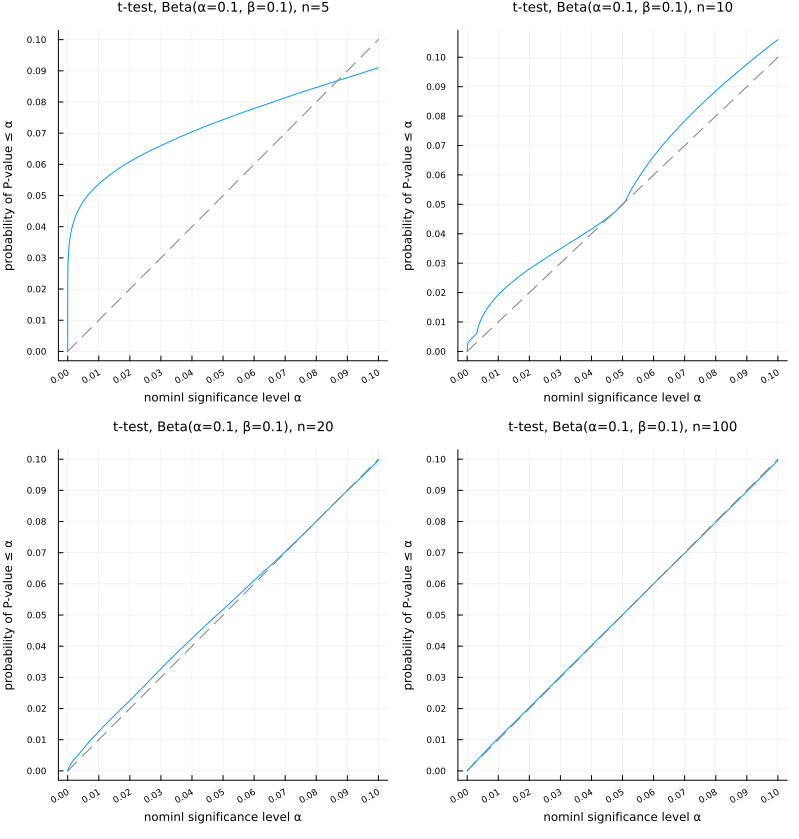

In [10]:
plot_sims(Beta(0.1, 0.1); ns=(5, 10, 20, 100))

skewness of TDist(ν=4.0) = 0.0
kurtosis of TDist(ν=4.0) = Inf

n = 5 => coverage probability (α=5%) = 0.890046
n = 10 => coverage probability (α=5%) = 0.924988
n = 20 => coverage probability (α=5%) = 0.93932
n = 100 => coverage probability (α=5%) = 0.9480729999999999



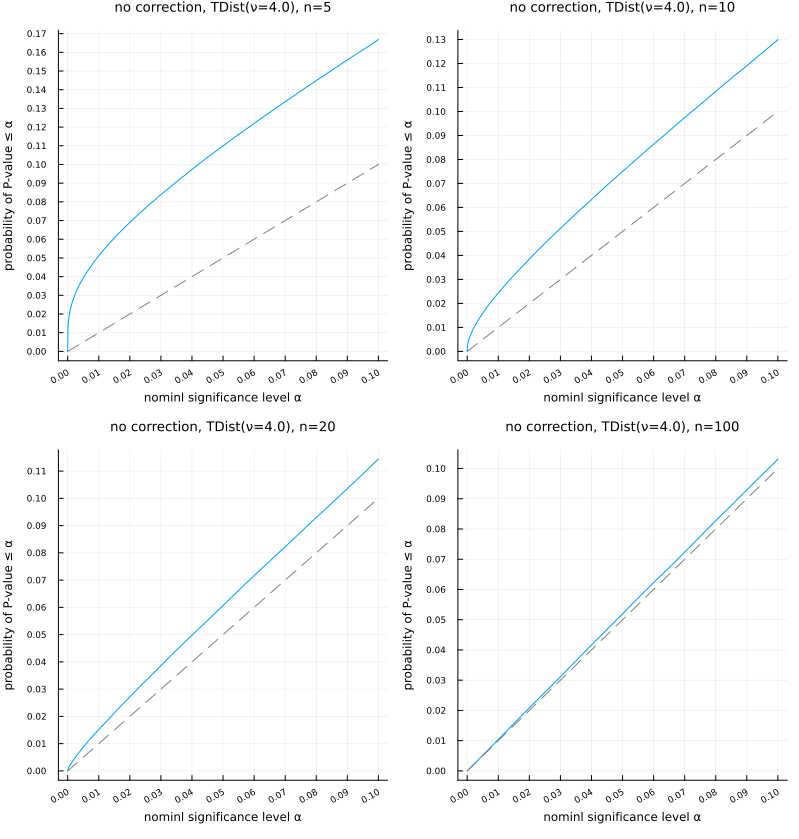

In [11]:
plot_sims(TDist(4); ns=(5, 10, 20, 100), correction=false)

skewness of TDist(ν=4.0) = 0.0
kurtosis of TDist(ν=4.0) = Inf

n = 5 => coverage probability (α=5%) = 0.959529
n = 10 => coverage probability (α=5%) = 0.956741
n = 20 => coverage probability (α=5%) = 0.954324
n = 100 => coverage probability (α=5%) = 0.951132



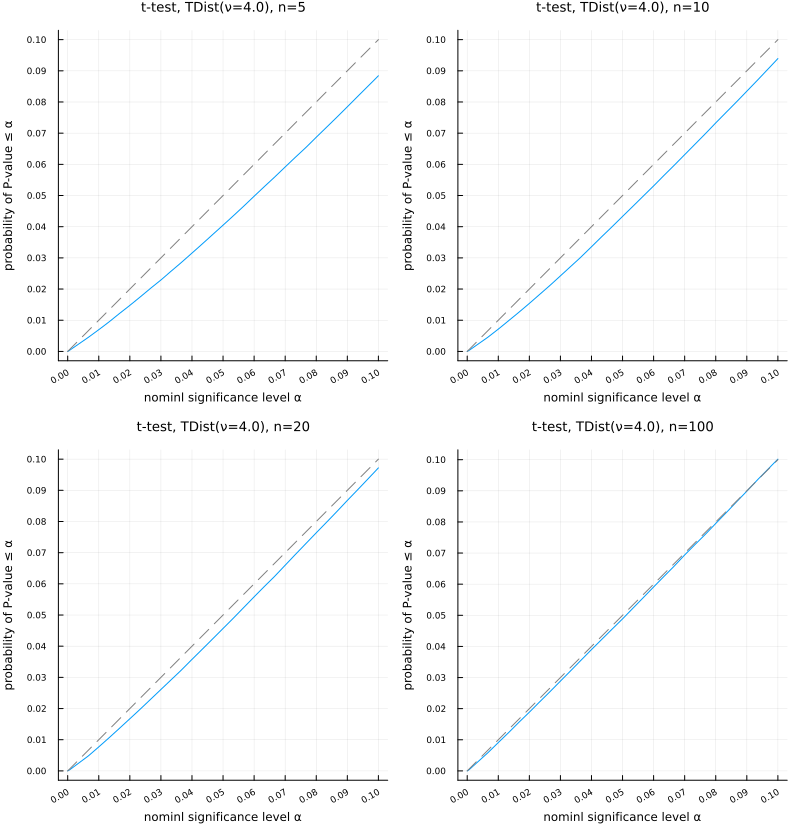

In [12]:
plot_sims(TDist(4); ns=(5, 10, 20, 100))

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 5 => coverage probability (α=5%) = 0.743098
n = 10 => coverage probability (α=5%) = 0.806843
n = 20 => coverage probability (α=5%) = 0.852092
n = 100 => coverage probability (α=5%) = 0.914412



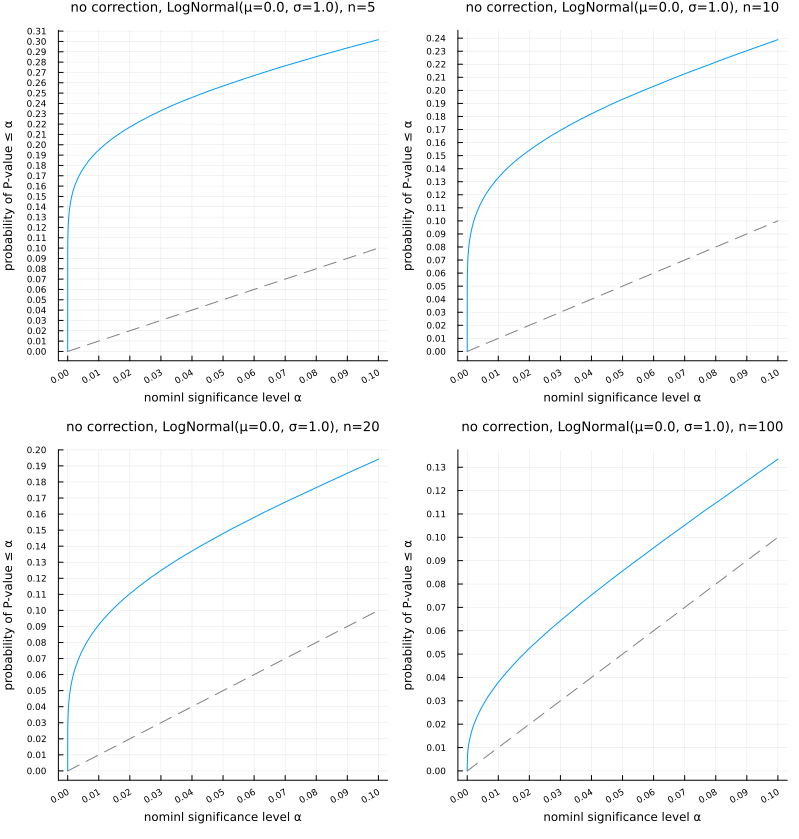

In [13]:
plot_sims(LogNormal(); ns=(5, 10, 20, 100), correction=false)

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 5 => coverage probability (α=5%) = 0.820925
n = 10 => coverage probability (α=5%) = 0.8392999999999999
n = 20 => coverage probability (α=5%) = 0.866754
n = 100 => coverage probability (α=5%) = 0.917268



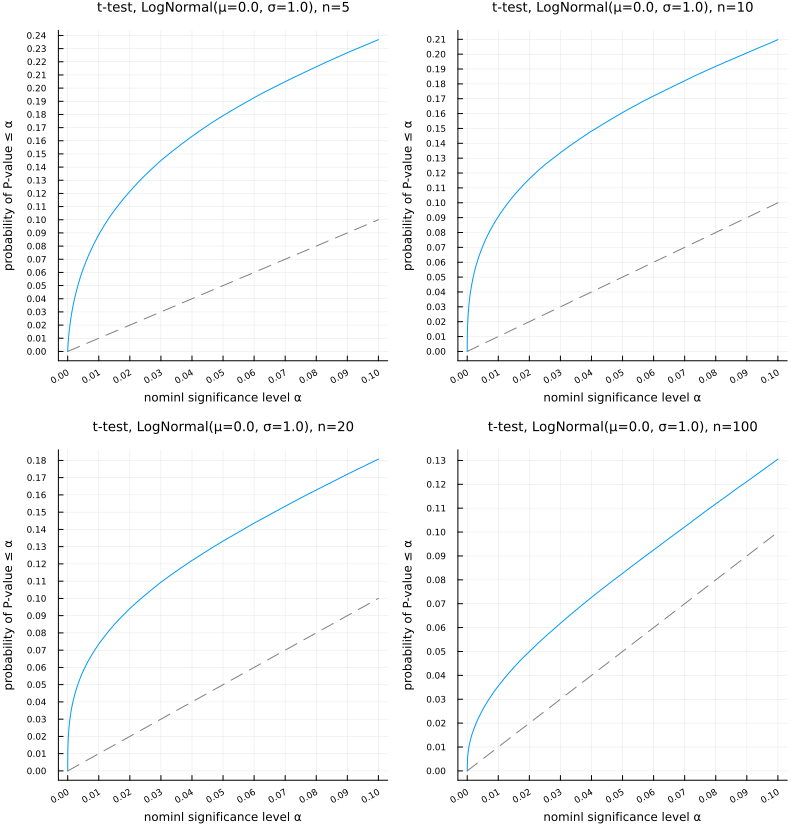

In [14]:
plot_sims(LogNormal(); ns=(5, 10, 20, 100))

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 100 => coverage probability (α=5%) = 0.914285
n = 300 => coverage probability (α=5%) = 0.933798
n = 1000 => coverage probability (α=5%) = 0.944219
n = 3000 => coverage probability (α=5%) = 0.947816



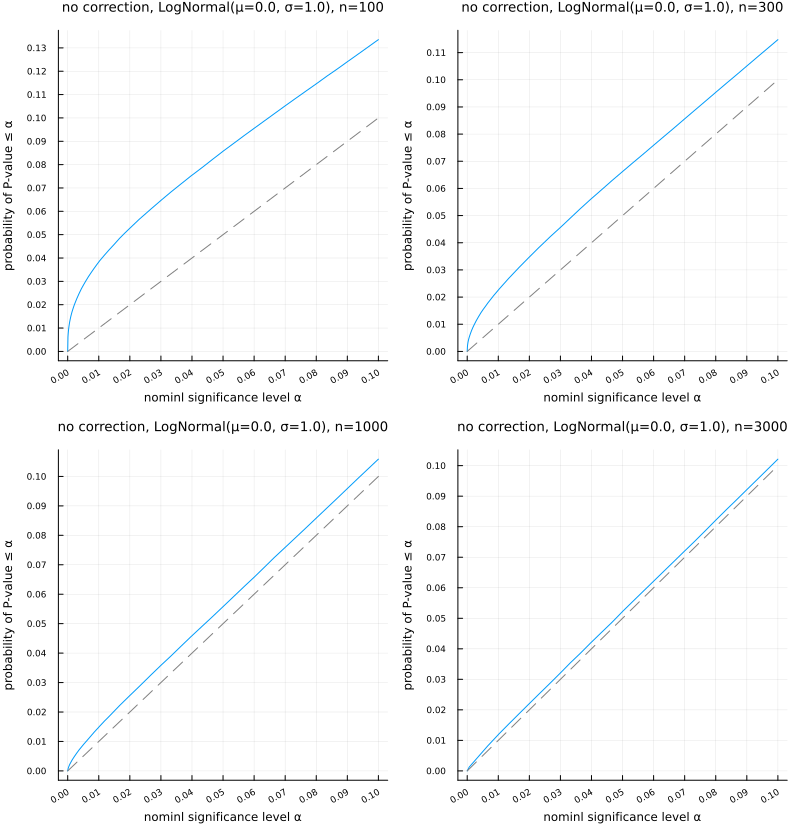

In [15]:
plot_sims(LogNormal(); ns=(100, 300, 1000, 3000), correction=false)

skewness of LogNormal(μ=0.0, σ=1.0) = 6.184877138632554
kurtosis of LogNormal(μ=0.0, σ=1.0) = 110.9363921763115

n = 100 => coverage probability (α=5%) = 0.917085
n = 300 => coverage probability (α=5%) = 0.934924
n = 1000 => coverage probability (α=5%) = 0.944272
n = 3000 => coverage probability (α=5%) = 0.947732



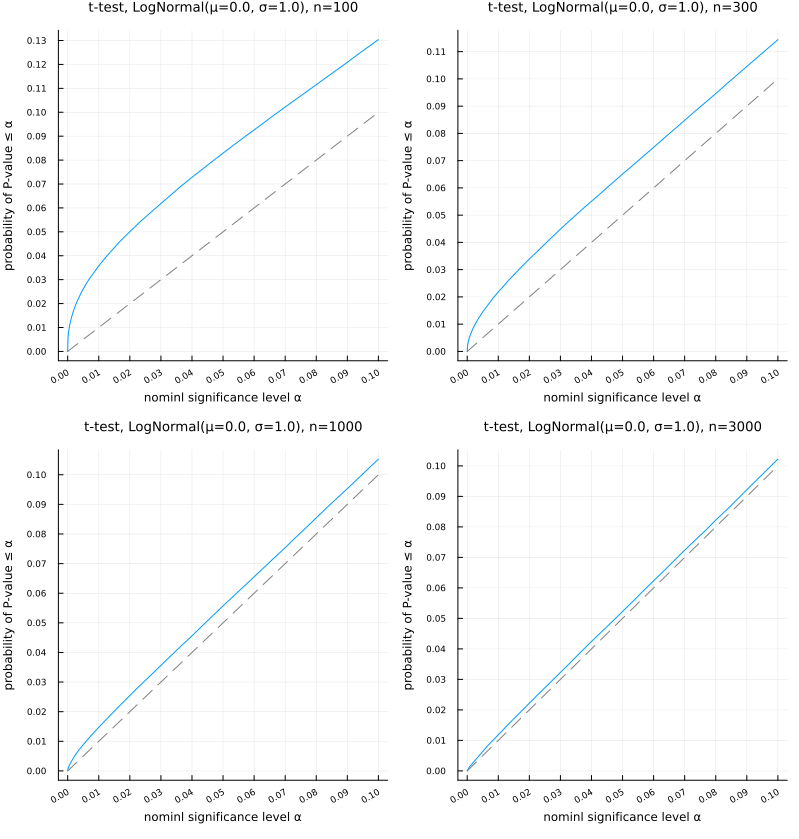

In [16]:
plot_sims(LogNormal(); ns=(100, 300, 1000, 3000))